# Trainging Set

## Image

In [2]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Specify the folder path
images_folder_path = "data/Trainning_SET/Images"

# List all files and directories in the folder
images_file_list = os.listdir(images_folder_path)

# Optionally filter out directories to get only files
images_file_list = [f for f in images_file_list if os.path.isfile(os.path.join(images_folder_path, f))]

In [3]:
print(f"There are {len(images_file_list)} trainging images")

There are 5200 trainging images


In [4]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

def print_images(file_list, folder_path):
    number_images = len(file_list)
    print(f"Printing {number_images} images")
    
    # render in one figure
    n_cols = 2
    n_rows = number_images // n_cols + (1 if number_images % n_cols != 0 else 0)
    
    # Create subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
    
    # Flatten axes for easier iteration
    axes = axes.flatten()
    
    # Loop through images and plot
    for i, file in enumerate(file_list):
        img = mpimg.imread(os.path.join(folder_path, file))
        ax = axes[i]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(file)
    
    # Hide unused axes (if any)
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.show()
    
def print_image(file, folder_path):
    img = mpimg.imread(os.path.join(folder_path, file))
    # scale to the normal image size
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

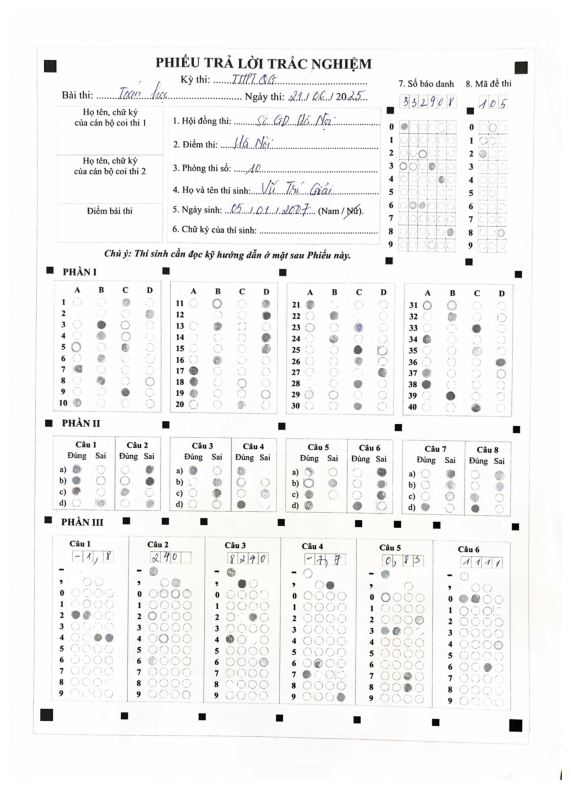

In [5]:
print_image(images_file_list[0], images_folder_path)

## Draw_labels

In [6]:
import os

# Specify the folder path
draw_labels_folder_path = "data/Trainning_SET/draw_labels"

# List all files and directories in the folder
draw_labels_file_list = os.listdir(draw_labels_folder_path)

# Optionally filter out directories to get only files
draw_labels_file_list = [f for f in draw_labels_file_list if os.path.isfile(os.path.join(draw_labels_folder_path, f))]

In [7]:
print(f"There are {len(draw_labels_file_list)} draw labels")

There are 5200 draw labels


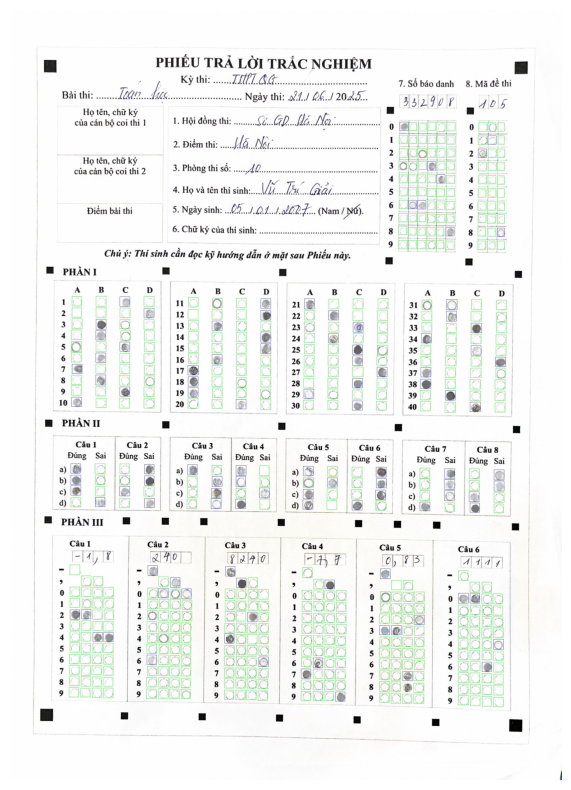

In [8]:
print_image(draw_labels_file_list[0], draw_labels_folder_path)

In [9]:
def print_image_labels(images_file_list, draw_labels_file_list, images_folder_path, draw_labels_folder_path, index):
    # print in the same figure 1*2 
    fig, axes = plt.subplots(1, 2, figsize=(15, 15))
    
    # Print image
    img = mpimg.imread(os.path.join(images_folder_path, images_file_list[index]))
    ax = axes[0]
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(images_file_list[index])
    
    # Print draw label
    img = mpimg.imread(os.path.join(draw_labels_folder_path, draw_labels_file_list[index]))
    ax = axes[1]
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(draw_labels_file_list[index])
    
    plt.show()

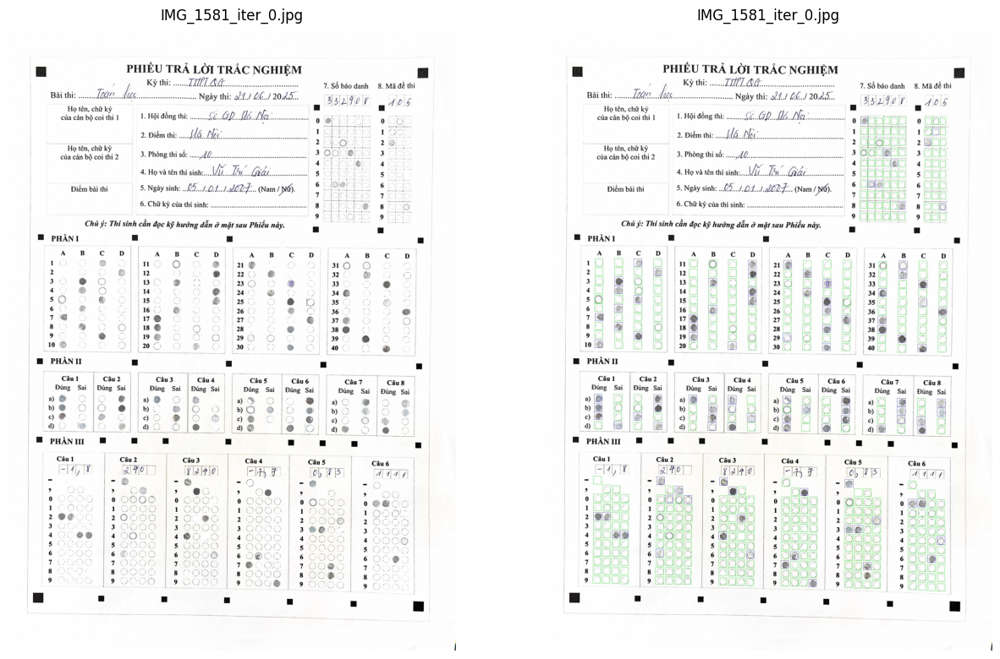

In [10]:
print_image_labels(images_file_list, draw_labels_file_list, images_folder_path, draw_labels_folder_path, 0)

## Labels

In [11]:
import os

# Specify the folder path
labels_folder_path = "data/Trainning_SET/Labels"

# List all files and directories in the folder
labels_file_list = os.listdir(labels_folder_path)

# Optionally filter out directories to get only files
labels_file_list = [f for f in labels_file_list if os.path.isfile(os.path.join(labels_folder_path, f))]

In [12]:
print(f"There are {len(labels_file_list)} Labels")

There are 5200 Labels


In [13]:
# read the label file and print the content
with open(os.path.join(labels_folder_path, labels_file_list[0])) as f:
    content = f.readlines()
    print(content)

['1 0.712195 0.269914 0.015078 0.011108\n', '1 0.712195 0.304507 0.015078 0.011108\n', '1 0.711973 0.286417 0.015521 0.011108\n', '1 0.711973 0.201999 0.014634 0.010473\n', '1 0.712639 0.252777 0.015078 0.011108\n', '1 0.712639 0.168359 0.015078 0.011108\n', '1 0.712639 0.185497 0.015078 0.011108\n', '1 0.712639 0.235957 0.015078 0.010473\n', '1 0.712639 0.219137 0.015078 0.010473\n', '0 0.713969 0.151222 0.015078 0.011108\n', '1 0.729047 0.304507 0.015078 0.011108\n', '1 0.729268 0.287052 0.014634 0.010473\n', '1 0.729490 0.269914 0.015078 0.011108\n', '1 0.729490 0.202634 0.015078 0.011108\n', '0 0.729490 0.253094 0.015078 0.010473\n', '1 0.729490 0.185497 0.015078 0.010473\n', '1 0.729490 0.219137 0.015078 0.010473\n', '1 0.729490 0.236274 0.015078 0.011108\n', '1 0.730155 0.168359 0.014634 0.010473\n', '1 0.730155 0.151222 0.014634 0.010473\n', '0 0.745898 0.253094 0.015078 0.011108\n', '1 0.745898 0.269914 0.015078 0.010473\n', '1 0.745898 0.287369 0.015078 0.010473\n', '1 0.74589

# Summarize 

+ Image folders contain 5200 images (which will be the same type of data when testing)
+ Draw_labels folders contain 5200 images (which already draw labesl, we cant access to this kind of data when testing)
+ Labels folders contain 5200 texts (this will be the labels for training) 

# Create dataframe

In [14]:
import pandas as pd

In [15]:
# check if there is "data/created/training.csv"
if os.path.exists("data/created/training.csv"):
    df = pd.read_csv("data/created/training.csv")
    print("File loaded")
else:
    df = pd.DataFrame(columns=["image_name", "draw_label_name", "label_name"])
    df["image_name"] = images_file_list
    df["draw_label_name"] = draw_labels_file_list
    df["label_name"] = labels_file_list
    def read_label_file(file_path):
        with open(file_path) as f:
            content = f.readlines()
            return content

    def len_label_file(file_path):
        return len(read_label_file(file_path))

    df["label_length"] = df["label_name"].apply(lambda x: len_label_file(os.path.join(labels_folder_path, x)))
    # # save df to csv

    df.to_csv("data/created/training.csv", index=False)

File loaded


# Label Error Analysis

In [16]:
df["label_length"].value_counts()

label_length
572     2080
1144    1040
1143     780
571      260
573      260
1139     260
1147     260
1142     260
Name: count, dtype: int64

NOTE: 
+ The bounding boxes for each image are not the same
+ My guess is some bb are missing while some are duplicated

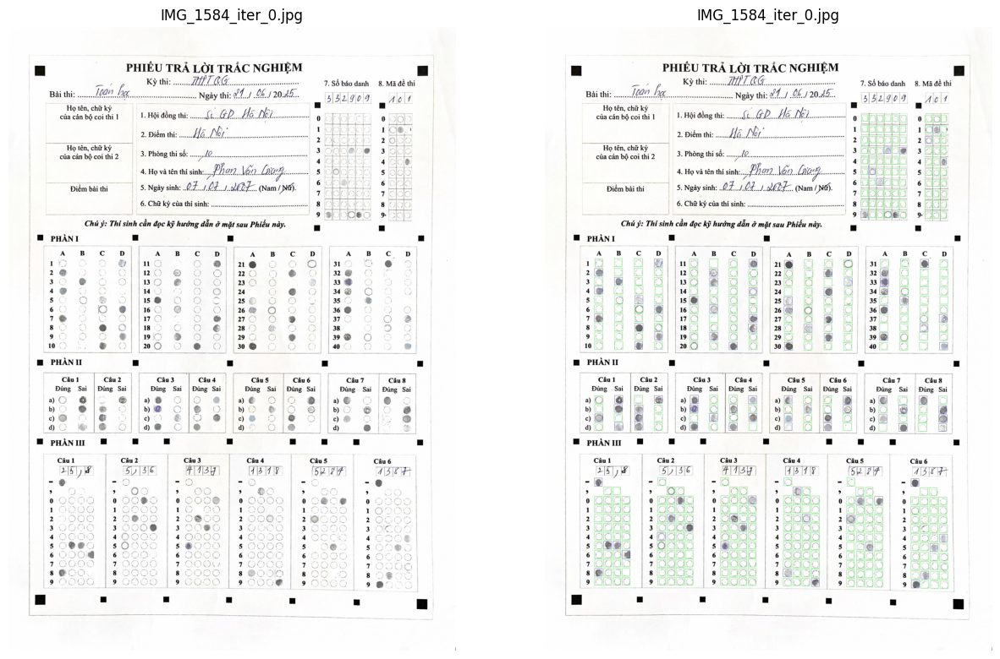

In [17]:
id_572 = df[df["label_length"] == 572].index[0]
print_image_labels(images_file_list, draw_labels_file_list, images_folder_path, draw_labels_folder_path, id_572)

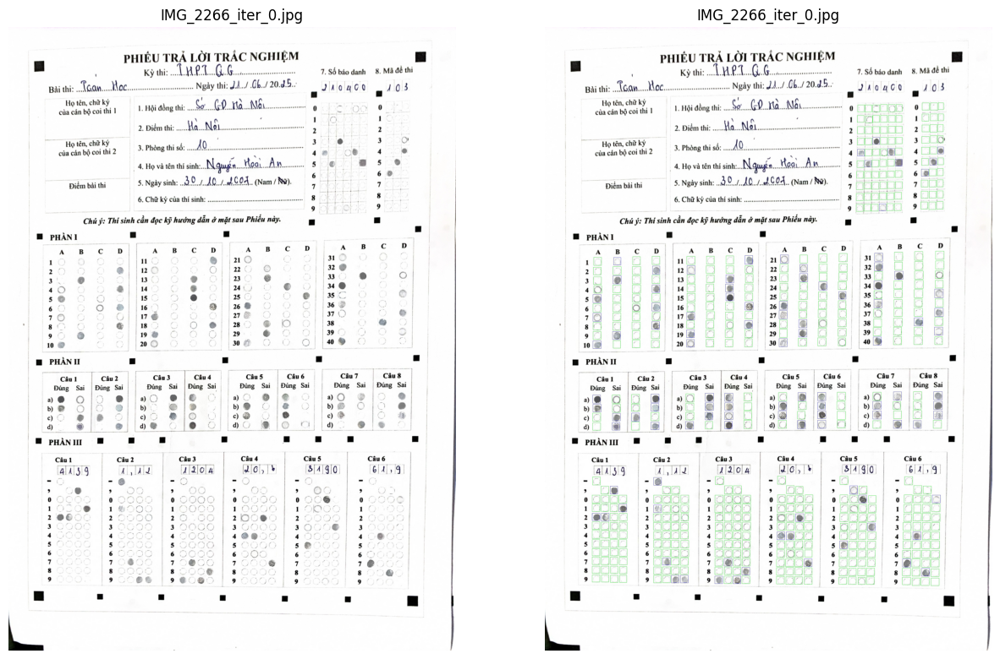

In [18]:
id_1144 = df[df["label_length"] == 1144].index[0]
print_image_labels(images_file_list, draw_labels_file_list, images_folder_path, draw_labels_folder_path, id_1144)

It seems that both image with 572 bb and 1144 bb have the same format.

So its highly that those bb are duplicated.

            image_name      draw_label_name           label_name  label_length
0  IMG_1581_iter_0.jpg  IMG_1581_iter_0.jpg  IMG_1581_iter_0.txt           571


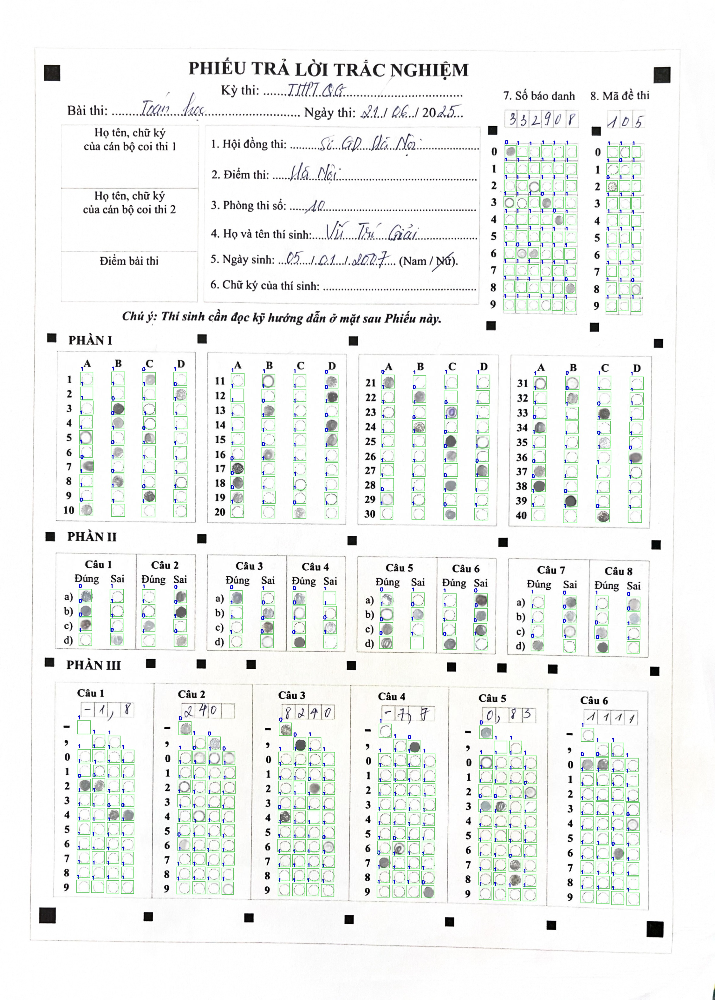

In [19]:
import cv2
from IPython.display import display, Image

def draw_yolo_bboxes(file_name, image_folder, label_folder,mode="score"):
    """
    Draws bounding boxes on an image based on YOLOv8 annotations and displays it in an IPython/Jupyter environment.

    Args:
        file_name: The base name of the files (without extension).
        image_folder: The path to the folder containing the image.
        label_folder: The path to the folder containing the label file.
    """

    image_path = f"{image_folder}/{file_name}.jpg"  # Assuming .jpg extension
    annotations_path = f"{label_folder}/{file_name}.txt"

    # Load the image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return

    height, width, _ = img.shape

    # Read and parse annotations
    try:
        with open(annotations_path, 'r') as f:
            lines = f.readlines()
    except FileNotFoundError:
        print(f"Error: Could not find annotations file at {annotations_path}")
        return

    for i,line in enumerate(lines):
        parts = line.strip().split()
        class_id = int(parts[0])
        x_center, y_center, bbox_width, bbox_height = map(float, parts[1:])

        # Convert normalized coordinates to pixel coordinates
        x_center *= width
        y_center *= height
        bbox_width *= width
        bbox_height *= height

        # Calculate top-left and bottom-right corner coordinates
        x1 = int(x_center - bbox_width / 2)
        y1 = int(y_center - bbox_height / 2)
        x2 = int(x_center + bbox_width / 2)
        y2 = int(y_center + bbox_height / 2)

        # Draw the rectangle
        color = (0, 255, 0)  # Green color (you can change this)
        color2 = (255, 0, 0)  
        thickness = 1
        cv2.rectangle(img, (x1, y1), (x2, y2), color, thickness)

        # Add class label (optional)
        if mode == "score":
            label = f"{class_id}"
        elif mode == "count":
            label = f"{i}"
        else: label = ""
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.5
        text_thickness = 2
        cv2.putText(img, label, (x1, y1 - 5), font, font_scale, color2, text_thickness)

    # Display the image in IPython/Jupyter
    _, buffer = cv2.imencode(".jpg", img)  # Encode as JPEG
    display(Image(data=buffer))

# Example usage (assuming you have defined images_folder_path and labels_folder_path):
file_name = "IMG_1581_iter_0"  # Base name of your files
print(df[df["image_name"] == file_name + ".jpg"])
draw_yolo_bboxes(file_name, images_folder_path, labels_folder_path)

Missing bb at 3.5.8

IMG_2266_iter_0


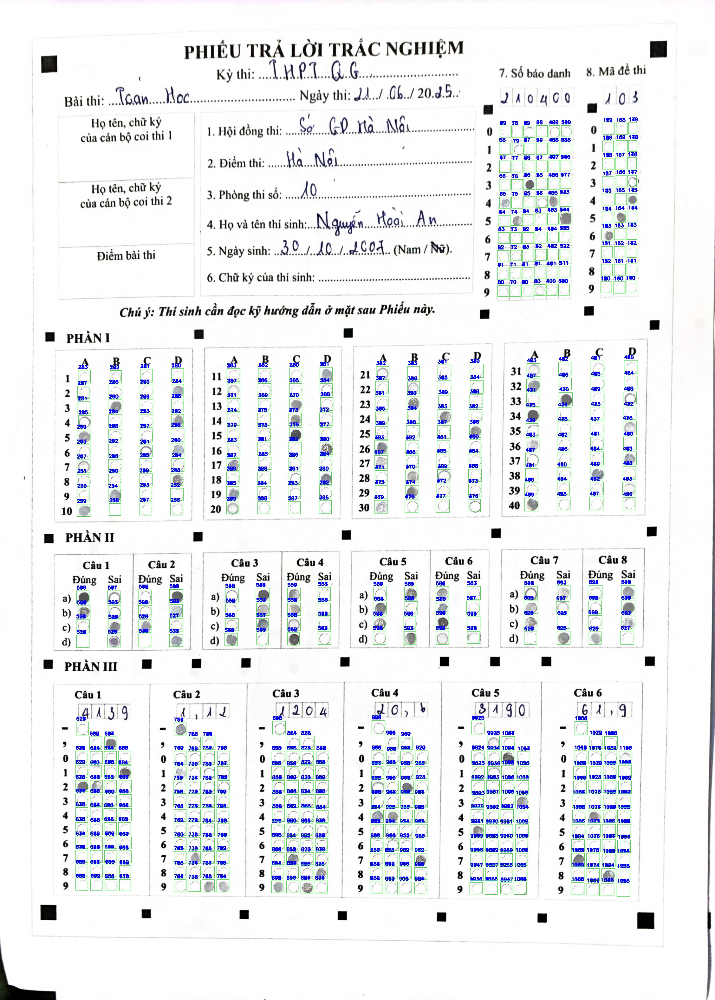

In [20]:
file_name = df.iloc[id_1144].image_name.split(".")[0]
print(file_name)
draw_yolo_bboxes(file_name, images_folder_path, labels_folder_path,mode="count")

Duplicated (double) bounding boxes

IMG_1586_iter_145


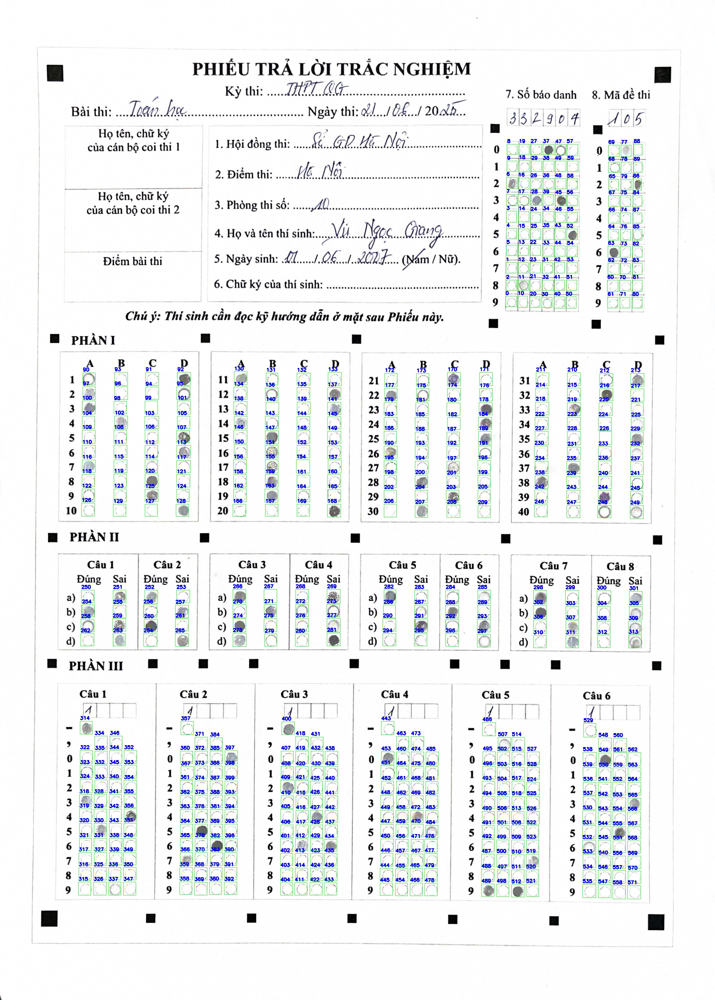

In [22]:
file_name = df.iloc[572].image_name.split(".")[0]
print(file_name)
draw_yolo_bboxes(file_name, images_folder_path, labels_folder_path,mode="count")

This seems to be the correct one

NOTE:
+ So my guess seem to be true
+ Let dive deeper into those bb error

In [21]:
df["label_length"].value_counts()

label_length
572     2080
1144    1040
1143     780
571      260
573      260
1139     260
1147     260
1142     260
Name: count, dtype: int64

For an image, we should have $10*6+10*3+10*4*4+2*4*8+(10*4+3)*6 = 572$

And $1144/572 = 2$, so my guess it that the bb are duplicated just once

We will use this simple local [web](web.py) to analyze the bb

Let first confirm the missing by checking some of the images with 571 bbs

In [28]:
ids_571 = df[df["label_length"] == 571].index
print(ids_571.values)

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245 24

Lets check if the above id_571 are continuos 

In [30]:
for i, id in enumerate(ids_571):
    if i != id: 
        print(i)

We can confirm that the first 259 images have the same type of error: missing at 3.5.8

In [32]:
df.iloc[ids_571]

,image_name,draw_label_name,label_name,label_length
0,IMG_1581_iter_0.jpg,IMG_1581_iter_0.jpg,IMG_1581_iter_0.txt,571
1,IMG_1581_iter_1.jpg,IMG_1581_iter_1.jpg,IMG_1581_iter_1.txt,571
2,IMG_1581_iter_10.jpg,IMG_1581_iter_10.jpg,IMG_1581_iter_10.txt,571
3,IMG_1581_iter_100.jpg,IMG_1581_iter_100.jpg,IMG_1581_iter_100.txt,571
4,IMG_1581_iter_101.jpg,IMG_1581_iter_101.jpg,IMG_1581_iter_101.txt,571
...,...,...,...,...
255,IMG_1581_iter_95.jpg,IMG_1581_iter_95.jpg,IMG_1581_iter_95.txt,571
256,IMG_1581_iter_96.jpg,IMG_1581_iter_96.jpg,IMG_1581_iter_96.txt,571
257,IMG_1581_iter_97.jpg,IMG_1581_iter_97.jpg,IMG_1581_iter_97.txt,571
258,IMG_1581_iter_98.jpg,IMG_1581_iter_98.jpg,IMG_1581_iter_98.txt,571


In [33]:
df.iloc[260]

image_name         IMG_1584_iter_0.jpg
draw_label_name    IMG_1584_iter_0.jpg
label_name         IMG_1584_iter_0.txt
label_length                       572
Name: 260, dtype: object

For the above obersevation, we can assume that the same id images have the same type of error

And also for each id, we will have 260 iters

In [34]:
ids_573 = df[df["label_length"] == 573].index
print(ids_573.values)

[1300 1301 1302 1303 1304 1305 1306 1307 1308 1309 1310 1311 1312 1313
 1314 1315 1316 1317 1318 1319 1320 1321 1322 1323 1324 1325 1326 1327
 1328 1329 1330 1331 1332 1333 1334 1335 1336 1337 1338 1339 1340 1341
 1342 1343 1344 1345 1346 1347 1348 1349 1350 1351 1352 1353 1354 1355
 1356 1357 1358 1359 1360 1361 1362 1363 1364 1365 1366 1367 1368 1369
 1370 1371 1372 1373 1374 1375 1376 1377 1378 1379 1380 1381 1382 1383
 1384 1385 1386 1387 1388 1389 1390 1391 1392 1393 1394 1395 1396 1397
 1398 1399 1400 1401 1402 1403 1404 1405 1406 1407 1408 1409 1410 1411
 1412 1413 1414 1415 1416 1417 1418 1419 1420 1421 1422 1423 1424 1425
 1426 1427 1428 1429 1430 1431 1432 1433 1434 1435 1436 1437 1438 1439
 1440 1441 1442 1443 1444 1445 1446 1447 1448 1449 1450 1451 1452 1453
 1454 1455 1456 1457 1458 1459 1460 1461 1462 1463 1464 1465 1466 1467
 1468 1469 1470 1471 1472 1473 1474 1475 1476 1477 1478 1479 1480 1481
 1482 1483 1484 1485 1486 1487 1488 1489 1490 1491 1492 1493 1494 1495
 1496 

In [36]:
for i, id in enumerate(ids_573):
    if (i+1300) != id: 
        print(i)

There are an extra bb at 3.5.,